<a href="https://colab.research.google.com/github/arlindomath/Covid19/blob/master/Data_Science_Covid_19_by_Arlindo_Matheus.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Estudando dados da Covid-19 com Python
por Arlindo Matheus


## Mapas

### Mapa de calor (HeatMap) no Python


O mapa de calor mostra quais são os pontos quentes dos dados. O exemplo que 
utilizamos nesse código são os dados da Covid-19, usando o mapa de calor podemos identificar as regiões com maior concentração de casos da doença. Para construir esse Mapa utilizaremos a Biblioteca Folium - Acesse a documentação: <https://python-visualization.github.io/folium/> 

**VAMOS AO CÓDIGO!**

Para instalar o Folium no Colab Notebook utilizamos o pip. O pip é o instalador de pacotes do Python, liguagem que estamos utilizando:

In [0]:
!pip install folium

Depois de instalar a biblioteca, devemos importá-la para o nosso código:

In [0]:
import folium

Com o folium presente, temos então a facilidade de importar o modelo de Mapa de Calor presente nos *plugins* da biblioteca, aqui então importaremos o HeatMap:

 ***ATENÇÃO PARA AS LETRAS MAIÚSCULAS E MINÚSCULAS, NO PYTHON ELAS FAZEM PARTE DA IDENTIDADE DO CÓDIGO E SEGUEM O PADRÃO DA LINGUAGEM*!**

In [0]:
from folium.plugins import HeatMap

Ao concluir todas as importações referentes ao Folium, partimos para a famigerada biblioteca Pandas, importantíssima para o nosso trabalho com dados. Com ela podemos além de importar dados podemos também editá-los:

*Pandas é o nome da biblioteca e como de costume os programadores as apelidam de pd, mas isso é opcional.*

In [0]:
import pandas as pd

  Agora de fato iremos trabalhar com os nossos dados!
  Em Python assim como em outras linguagens precisamos nos atentar para algumas 
  informações, como por exemplo o sinal de igual (=). Aqui no Python esse sinal
  quer dizer que alguma variável **RECEBE** informações de um DataFrame (Matriz de Dados), 
  perceba que eu enfatizei a palavra recebe, isso porque no Python o sinal de 
  igual isolado quer dizer exatamente isso. Se eu quiser usar o sinal de igual 
  aqui eu utilizo dois sinais (==), por exemplo 1 == 1.

Seguindo com o código, a variável (dados_covid19) irá receber informações do arquivo CSV do Github do Wesley Cota - Acesse: <https://github.com/wcota/covid19br>

In [0]:
dados_covid19 = pd.read_csv('https://raw.githubusercontent.com/wcota/covid19br/master/cases-gps.csv')

Depois de receber os dados podemos mostrá-los, utilizando a função .head() podemos mostrar as 5 primeiras linhas do arquivo CSV. Então o Nome_da_Variável + a função .head(), mostra os 5 primeiros dados da tabela:

In [0]:
dados_covid19.head()

,type,name,lat,lon,total,total_per_100k_inhabitants
0,1,Abadia de Goiás/GO,-16.757264,-49.441221,6,68.39166
1,1,Abadia dos Dourados/MG,-18.491119,-47.406359,5,71.54099
2,1,Abadiânia/GO,-16.194095,-48.706777,2,9.97904
3,1,Abaetetuba/PA,-1.721828,-48.878843,1556,986.69609
4,D1,Abaetetuba/PA,-1.721828,-48.878843,51,32.34030


Agora que temos nossos dados, precisamos criar um mapa base para que o plugin do Folium funcione, para isso precisamos das coordenadas geográficas de um ponto que queremos mostrar no mapa, aqui utilizaremos o mapa do Brasil como exemplo. Declaramos um variável que irá receber o mapa base, com a orientanção das coordenadas geográficas centralizamos a localizaçao no mapa, definimos o zoom inicial do mapa, se quiser pode também definir o zoom mínimo e máximo, no caso utilizaremos o zoom mínimo e por fim mostramos a orientação de escalas:

In [0]:
mapa = folium.Map (location=[-15.77972, -47.92972], zoom_start=4, min_zoom=4, control_scale=True)

Para mostrar o mapa apenas chamamos nossa variável:

In [0]:
mapa

Agora precisamos definir através dos nossos dados as localizações de cada informação, aqui utilizando a variável locais rebemos os dados e contruímos uma lista com essas informações:

In [0]:
locais = dados_covid19 [["lat","lon"]].values.tolist()

In [0]:
locais

[[-16.7572644, -49.4412205],
 [-18.491119100000002, -47.4063589],
 [-16.1940946, -48.706776700000006],
 [-1.721828, -48.878842999999996],
 [-1.721828, -48.878842999999996],
 [-19.1566833, -45.4481213],
 [-7.360780800000001, -39.0487878],
 [-23.3052967, -50.3102532],
 [-13.2503296, -41.6640342],
 [-4.953001, -48.3958485],
 [-4.953001, -48.3958485],
 [-26.570589299999998, -52.3280339],
 [-7.9007190000000005, -34.898389],
 [-7.9007190000000005, -34.898389],
 [-9.6221526, -49.1558343],
 [-11.6609659, -38.0186381],
 [-4.2237865999999995, -38.7071663],
 [-4.2237865999999995, -38.7071663],
 [-2.8869514, -40.1194713],
 [-2.8869514, -40.1194713],
 [-6.4364689, -36.6394777],
 [-1.9613880000000001, -48.198704299999996],
 [-1.9613880000000001, -48.198704299999996],
 [-6.093646400000001, -39.4543204],
 [-6.093646400000001, -39.4543204],
 [-15.200154399999999, -56.366895299999996],
 [-10.075916699999999, -67.0526898],
 [-10.075916699999999, -67.0526898],
 [-21.6866517, -51.076297499999995],
 [-21.68

Chamando o plugin HeatMap chamamos nossa variável locais e definimos o raio de corbetura do dados no mapa e por fim apenas adicionamos essas informações no mapa base:

In [0]:
HeatMap (locais, radius=13).add_to(mapa)
mapa.save('mapa.html')

Pronto, agora temos o nosso mapa de calor feito em Python com dados da Covid-19:

In [0]:
mapa

### Mapa de Calor com pontos

Novamente carregamos nossa base de dados:

In [0]:
dados_covid19.head()

,type,name,lat,lon,total,total_per_100k_inhabitants
0,1,Abadia de Goiás/GO,-16.757264,-49.441221,6,68.39166
1,1,Abadia dos Dourados/MG,-18.491119,-47.406359,5,71.54099
2,1,Abadiânia/GO,-16.194095,-48.706777,2,9.97904
3,1,Abaetetuba/PA,-1.721828,-48.878843,1556,986.69609
4,D1,Abaetetuba/PA,-1.721828,-48.878843,51,32.34030


Aqui vamos criar um parâmetro para que as cidades que são acometidas pelo vírus sejam marcadas com um circulo, na cor preta e ainda usando um pouco de HTML para criar balões com informações:

In [0]:
for i in range(0, len(dados_covid19)):
    folium.Circle(
        location =  [dados_covid19.iloc[i]['lat'], dados_covid19.iloc[i]['lon']],
        color = '#000000',
        fill = '#00A1B3',
        tooltip = '<li><bold> CIDADE:' + str(dados_covid19.iloc[i]['name'])+
                  '<li><bold> CASOS :' + str(dados_covid19.iloc[i]['total']),
        radius = (dados_covid19.iloc[i]['total']*1.1)
        ).add_to(mapa)

Rodando o código, podemos mostrar o nosso novo mapa:

In [0]:
mapa

### Mapa Coroplético (Choropleth) no Python

Mapa coroplético é um tipo de mapa temático que representa normalmente uma superfície estatística por meio de cores, sombreamentos ou padrões de acordo com uma escala que representa a proporcionalidade da variável estatística em causa, como por exemplo a densidade populacional ou o rendimento per capita.Para contruir esse Mapa utilizaremos a Biblioteca Folium - Acesse a documentação: https://python-visualization.github.io/folium/

Vamos começar importando nossas bibliotecas primeiro o pandas, um leitor de arquivos Json (JavaScript Object Notation, ou seja um arquivo de armazenamento de dados em Javascript) importamos o folium para criarmos o nosso mapa e a biblioteca Numpy para tratarmos os valores: 

In [0]:
import pandas as pd

In [0]:
import json

In [0]:
import folium

In [0]:
import numpy as np

In [0]:
covid19= pd.read_csv ('https://brasil.io/dataset/covid19/caso/?format=csv')

In [0]:
covid19.head(3)

,date,state,city,place_type,confirmed,deaths,is_last,estimated_population_2019,city_ibge_code,confirmed_per_100k_inhabitants,death_rate
0,2020-05-29,AL,Anadia,city,29,1,True,17545.0,2700201.0,165.28926,0.0345
1,2020-05-29,AL,Arapiraca,city,323,11,True,231747.0,2700300.0,139.37613,0.0341
2,2020-05-29,AL,Atalaia,city,149,3,True,47185.0,2700409.0,315.77832,0.0201


In [0]:
covid19estados = covid19.loc[covid19.place_type =='state', ['state', 'confirmed', 'is_last']]

In [0]:
covid19estados.head()

,state,confirmed,is_last
102,AL,8619,True
120,AP,8469,True
424,BA,16917,True
608,CE,38395,True
611,DF,8722,True


In [0]:
covid19ultimos = covid19estados.loc[covid19estados.is_last == True, ['state', 'confirmed']]

In [0]:
covid19ultimos['confirmed'].sum()

459501

In [0]:
covid19ultimos['log_confirmed'] = np.log(covid19ultimos['confirmed'])

In [0]:
covid19ultimos.to_excel('covid19.xlsx')

In [0]:
geoJson = ('https://raw.githubusercontent.com/luizpedone/municipal-brazilian-geodata/master/data/Brasil.json')

In [0]:
mapaepidemiologico = folium.Map (location=[-15.77972, -47.92972], zoom_start=4, min_zoom=4, control_scale=True)

In [0]:
folium.Choropleth(
    geo_data = geoJson,
    data = covid19ultimos,
    columns = ['state', 'log_confirmed'],
    key_on = 'feature.properties.UF',
    fill_color = 'YlOrRd',
    bins = 9
   ).add_to(mapaepidemiologico)
folium.map.LayerControl().add_to(mapaepidemiologico)
mapaepidemiologico.save('mapaepidemiologico.html')


In [0]:
mapaepidemiologico

## Gráficos

### Gráfico de linhas comparando países

In [0]:
import pandas as pd
import matplotlib.pyplot as plt

In [0]:
df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')

In [0]:
df = df.groupby('Country/Region').sum()

In [0]:
df.head()

,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,...,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20
Country/Region,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,33.0000,65.0000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,...,1026,1092,1176,1279,1351,1463,1531,1703,1828,1939,2171,2335,2469,2704,2894,3224,3392,3563,3778,4033,4402,4687,4963,5226,5639,6053,6402,6664,7072,7653,8145,8676,9216,9998,10582,11173,11831,12456,13036,13659
Albania,41.1533,20.1683,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,584,609,634,663,678,712,726,736,750,766,773,782,789,795,803,820,832,842,850,856,868,872,876,880,898,916,933,946,948,949,964,969,981,989,998,1004,1029,1050,1076,1099
Algeria,28.0339,1.6596,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,...,2718,2811,2910,3007,3127,3256,3382,3517,3649,3848,4006,4154,4295,4474,4648,4838,4997,5182,5369,5558,5723,5891,6067,6253,6442,6629,6821,7019,7201,7377,7542,7728,7918,8113,8306,8503,8697,8857,8997,9134
Andorra,42.5063,1.5218,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,717,717,723,723,731,738,738,743,743,743,745,745,747,748,750,751,751,752,752,754,755,755,758,760,761,761,761,761,761,761,762,762,762,762,762,763,763,763,763,764
Angola,-11.2027,17.8739,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,24,24,25,25,25,25,26,27,27,27,27,30,35,35,35,36,36,36,43,43,45,45,45,45,48,48,48,48,50,52,52,58,60,61,69,70,70,71,74,81


In [0]:
df = df.drop(columns=['Lat','Long'])

In [0]:
df.head()

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,...,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20
Country/Region,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,...,1026,1092,1176,1279,1351,1463,1531,1703,1828,1939,2171,2335,2469,2704,2894,3224,3392,3563,3778,4033,4402,4687,4963,5226,5639,6053,6402,6664,7072,7653,8145,8676,9216,9998,10582,11173,11831,12456,13036,13659
Albania,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,584,609,634,663,678,712,726,736,750,766,773,782,789,795,803,820,832,842,850,856,868,872,876,880,898,916,933,946,948,949,964,969,981,989,998,1004,1029,1050,1076,1099
Algeria,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,...,2718,2811,2910,3007,3127,3256,3382,3517,3649,3848,4006,4154,4295,4474,4648,4838,4997,5182,5369,5558,5723,5891,6067,6253,6442,6629,6821,7019,7201,7377,7542,7728,7918,8113,8306,8503,8697,8857,8997,9134
Andorra,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,717,717,723,723,731,738,738,743,743,743,745,745,747,748,750,751,751,752,752,754,755,755,758,760,761,761,761,761,761,761,762,762,762,762,762,763,763,763,763,764
Angola,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,24,24,25,25,25,25,26,27,27,27,27,30,35,35,35,36,36,36,43,43,45,45,45,45,48,48,48,48,50,52,52,58,60,61,69,70,70,71,74,81


In [0]:
df_transp = df.T

In [0]:
df_transp.tail()

Country/Region,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Austria,Azerbaijan,Bahamas,Bahrain,Bangladesh,Barbados,Belarus,Belgium,Belize,Benin,Bhutan,Bolivia,Bosnia and Herzegovina,Botswana,Brazil,Brunei,Bulgaria,Burkina Faso,Burma,Burundi,Cabo Verde,Cambodia,Cameroon,Canada,Central African Republic,Chad,Chile,China,Colombia,Comoros,Congo (Brazzaville),...,Senegal,Serbia,Seychelles,Sierra Leone,Singapore,Slovakia,Slovenia,Somalia,South Africa,South Sudan,Spain,Sri Lanka,Sudan,Suriname,Sweden,Switzerland,Syria,Taiwan*,Tajikistan,Tanzania,Thailand,Timor-Leste,Togo,Trinidad and Tobago,Tunisia,Turkey,US,Uganda,Ukraine,United Arab Emirates,United Kingdom,Uruguay,Uzbekistan,Venezuela,Vietnam,West Bank and Gaza,Western Sahara,Yemen,Zambia,Zimbabwe
5/25/20,11173,1004,8503,763,70,25,12628,7113,7126,16539,4271,100,9171,35585,92,37144,57342,18,191,27,6660,2406,35,374898,141,2433,832,203,42,390,124,4890,87119,652,687,73997,84102,21981,87,487,...,3130,11193,11,735,31960,1511,1469,1689,23615,806,235400,1182,3976,11,33843,30746,106,441,3100,509,3042,24,386,116,1051,157814,1662302,222,21245,30307,262547,787,3189,1177,326,423,9,233,920,56
5/26/20,11831,1029,8697,763,70,25,13228,7402,7139,16557,4403,100,9366,36751,92,38059,57455,18,208,27,7136,2416,35,391222,141,2443,832,206,42,390,124,5436,88090,671,700,77961,84103,23003,87,487,...,3161,11227,11,754,32343,1513,1469,1711,24264,806,236259,1319,3976,11,34440,30761,121,441,3266,509,3045,24,391,116,1051,158762,1680913,253,21584,31086,266599,789,3290,1211,327,429,9,249,920,56
5/27/20,12456,1050,8857,763,71,25,13933,7774,7150,16591,4568,100,9692,38292,92,38956,57592,18,210,28,7768,2435,35,411821,141,2460,845,206,42,390,124,5436,88989,702,715,82289,84106,24104,87,571,...,3253,11275,11,782,32876,1515,1471,1731,25937,994,236259,1469,4346,12,35088,30776,121,441,3424,509,3054,24,395,116,1051,159797,1699176,281,21905,31969,268619,803,3369,1245,327,434,9,256,1057,132
5/28/20,13036,1076,8997,763,74,25,14702,8216,7165,16628,4759,101,10052,40321,92,39858,57849,18,210,31,8387,2462,35,438238,141,2477,847,206,42,390,124,5436,89976,755,726,86943,84106,24141,87,571,...,3348,11300,11,812,33249,1520,1473,1828,27403,994,237906,1530,4346,12,35727,30796,122,441,3563,509,3065,24,422,116,1068,160979,1721753,317,22382,32532,270508,811,3444,1325,327,446,9,278,1057,149
5/29/20,13659,1099,9134,764,81,25,15419,8676,7184,16655,4989,102,10449,42844,92,40764,58061,18,224,31,8731,2485,35,465166,141,2485,847,207,42,405,124,5436,90909,874,759,90638,84123,25406,87,571,...,3429,11354,11,829,33860,1520,1473,1828,29240,994,238564,1558,4521,12,36476,30828,122,442,3686,509,3076,24,428,116,1071,162120,1746019,329,22811,33170,272607,816,3468,1370,328,446,9,283,1057,149


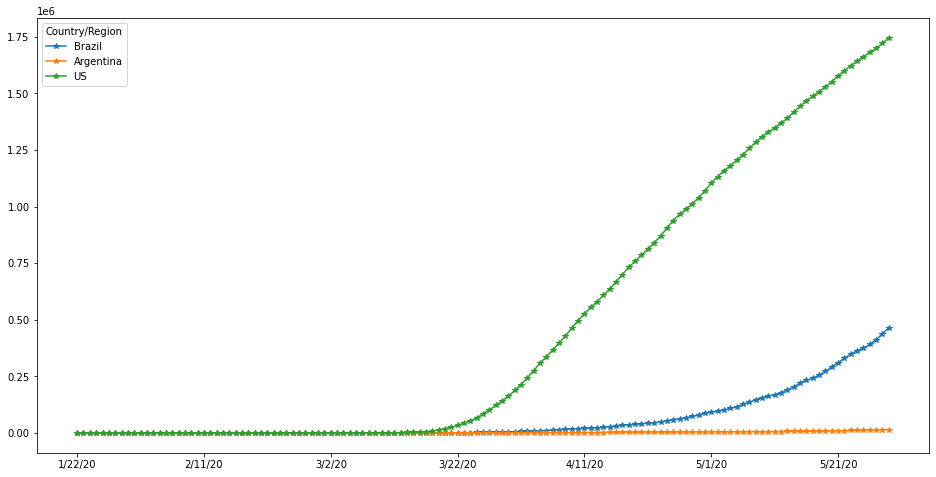

In [0]:
df_transp.plot(y=['Brazil', 'Argentina','US'], use_index=True, figsize = (16,8), marker = '*')

In [0]:
import pandas as pd
import numpy as np

In [0]:
df = pd.read_csv('https://brasil.io/dataset/covid19/caso?format=csv')

In [0]:
df

,date,state,city,place_type,confirmed,deaths,is_last,estimated_population_2019,city_ibge_code,confirmed_per_100k_inhabitants,death_rate
0,2020-05-29,AL,Anadia,city,29,1,True,17545.0,2700201.0,165.28926,0.0345
1,2020-05-29,AL,Arapiraca,city,323,11,True,231747.0,2700300.0,139.37613,0.0341
2,2020-05-29,AL,Atalaia,city,149,3,True,47185.0,2700409.0,315.77832,0.0201
3,2020-05-29,AL,Barra de Santo Antônio,city,16,2,True,15932.0,2700508.0,100.42681,0.1250
4,2020-05-29,AL,Barra de São Miguel,city,19,1,True,8322.0,2700607.0,228.31050,0.0526
...,...,...,...,...,...,...,...,...,...,...,...
133843,2020-02-27,SP,NaN,state,1,0,False,45919049.0,35.0,0.00218,0.0000
133844,2020-02-26,SP,São Paulo,city,1,0,False,12252023.0,3550308.0,0.00816,0.0000
133845,2020-02-26,SP,NaN,state,1,0,False,45919049.0,35.0,0.00218,0.0000
133846,2020-02-25,SP,São Paulo,city,1,0,False,12252023.0,3550308.0,0.00816,0.0000


In [0]:
estados = df.loc[df.place_type=='state',:]

In [0]:
estados.state.unique()

array(['AL', 'AP', 'BA', 'CE', 'DF', 'ES', 'GO', 'MA', 'MG', 'PA', 'PB',
       'PE', 'PI', 'PR', 'RO', 'RS', 'SP', 'AM', 'MS', 'RJ', 'RN', 'SC',
       'MT', 'SE', 'TO', 'AC', 'RR'], dtype=object)

In [0]:
data = estados[['date','state','confirmed','deaths','is_last']]

In [0]:
data.loc[data.is_last==True , ['confirmed','deaths'] ].sum()

confirmed    459501
deaths        27628
dtype: int64

In [0]:
covid = pd.DataFrame()

In [0]:
estado = 'SP'
situacao = 'confirmed'
df_estado = data.loc[data.state==estado, :]
df_estado = df_estado.groupby('date').sum()[situacao].reset_index()
df_estado = df_estado.drop("date", axis=1)
df_estado.columns = [estado]
covid = pd.concat([covid, df_estado], ignore_index=True, axis=1)

In [0]:
covid

,0
0,1
1,1
2,1
3,2
4,2
...,...
88,83625
89,86017
90,89483
91,95865


In [0]:
estado = 'RJ'
situacao = 'confirmed'
df_estado = data.loc[data.state==estado, :]
df_estado = df_estado.groupby('date').sum()[situacao].reset_index()
df_estado = df_estado.drop("date", axis=1)
covid = pd.concat([covid, df_estado], ignore_index=True, axis=1)

In [0]:

covid


,0,1
0,1,1.0
1,1,2.0
2,1,3.0
3,2,15.0
4,2,24.0
...,...,...
88,83625,NaN
89,86017,NaN
90,89483,NaN
91,95865,NaN


In [0]:
def desde1caso(data, estados, dias, situacao):

  covid = pd.DataFrame()

  for estado in estados:
    try:
      df_estado = data.loc[data.state==estado, :]
      df_estado = df_estado.groupby('date').sum()[situacao].reset_index()
      df_estado = df_estado.drop("date", axis=1)
      covid = pd.concat([covid, df_estado], ignore_index=True, axis=1)
    except:
      print("Is not " + situacao + " in " + estado )
  
  covid.columns = estados

  return covid.head(dias)

In [0]:
df_estados = desde1caso(data,['SP','RJ', 'AM','CE','BA'], 100,'confirmed')

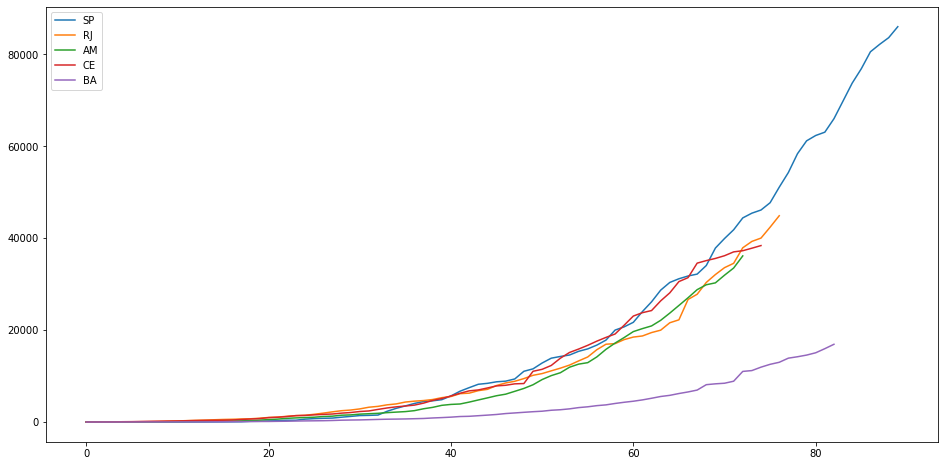

In [0]:
df_estados.plot(figsize = (16,8))

### Prophet

In [0]:
import pandas as pd
import numpy as np
 
from fbprophet import Prophet

In [0]:
dfcovid = pd.read_csv('covid_19_data.csv')

In [0]:
dfcovid.tail(3)

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
30880,30881,05/28/2020,Yunnan,Mainland China,2020-05-29 02:32:50,185.0,2.0,183.0
30881,30882,05/28/2020,Zacatecas,Mexico,2020-05-29 02:32:50,272.0,31.0,182.0
30882,30883,05/28/2020,Zhejiang,Mainland China,2020-05-29 02:32:50,1268.0,1.0,1267.0


In [0]:
dfcovid.rename(columns={'ObservationDate':'Date','Country/Region':'Country'}, inplace=True)

In [0]:
dfcovid.tail(3)

,SNo,Date,Province/State,Country,Last Update,Confirmed,Deaths,Recovered
30880,30881,05/28/2020,Yunnan,Mainland China,2020-05-29 02:32:50,185.0,2.0,183.0
30881,30882,05/28/2020,Zacatecas,Mexico,2020-05-29 02:32:50,272.0,31.0,182.0
30882,30883,05/28/2020,Zhejiang,Mainland China,2020-05-29 02:32:50,1268.0,1.0,1267.0


In [0]:
deaths = dfcovid.groupby('Date').sum()['Deaths'].reset_index()

In [0]:
deaths.tail(3)

,Date,Deaths
125,05/26/2020,350453.0
126,05/27/2020,355629.0
127,05/28/2020,360308.0


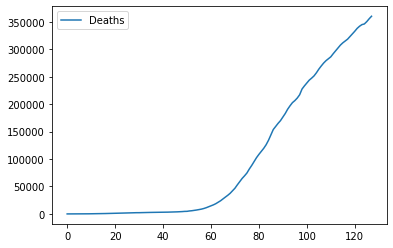

In [0]:
deaths.plot()

In [0]:
deaths.columns = ['ds','y']

In [0]:
deaths.tail(3)

,ds,y
125,05/26/2020,350453.0
126,05/27/2020,355629.0
127,05/28/2020,360308.0


In [0]:
deaths['ds'] = pd.to_datetime(deaths['ds'])

In [0]:
deaths.tail(3)

,ds,y
125,2020-05-26,350453.0
126,2020-05-27,355629.0
127,2020-05-28,360308.0


In [0]:
m = Prophet(interval_width=0.95)
m.fit(deaths)
future = m.make_future_dataframe(periods=30)
future.tail(7)

INFO:numexpr.utils:NumExpr defaulting to 2 threads.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds
151,2020-06-21
152,2020-06-22
153,2020-06-23
154,2020-06-24
155,2020-06-25
156,2020-06-26
157,2020-06-27


In [0]:
previsao = m.predict(future)
previsao.tail(40)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
118,2020-05-19,322606.211724,319870.177237,324031.482063,322606.211724,322606.211724,-622.112887,-622.112887,-622.112887,-622.112887,-622.112887,-622.112887,0.0,0.0,0.0,321984.098837
119,2020-05-20,327140.600318,324827.198425,329308.181764,327140.600318,327140.600318,-97.897169,-97.897169,-97.897169,-97.897169,-97.897169,-97.897169,0.0,0.0,0.0,327042.703149
120,2020-05-21,331674.988912,329759.894033,334150.502844,331674.988912,331674.988912,301.808965,301.808965,301.808965,301.808965,301.808965,301.808965,0.0,0.0,0.0,331976.797876
121,2020-05-22,336209.377506,334827.063210,339148.668323,336209.377506,336209.377506,806.376161,806.376161,806.376161,806.376161,806.376161,806.376161,0.0,0.0,0.0,337015.753666
122,2020-05-23,340743.766100,338977.519013,343461.602090,340743.766100,340743.766100,536.219199,536.219199,536.219199,536.219199,536.219199,536.219199,0.0,0.0,0.0,341279.985299
123,2020-05-24,345278.154694,342871.368360,347349.652279,345278.154694,345278.154694,-118.752995,-118.752995,-118.752995,-118.752995,-118.752995,-118.752995,0.0,0.0,0.0,345159.401698
124,2020-05-25,349812.543288,346883.261503,351072.354019,349812.543288,349812.543288,-805.641273,-805.641273,-805.641273,-805.641273,-805.641273,-805.641273,0.0,0.0,0.0,349006.902015
125,2020-05-26,354346.931882,351491.747487,356048.607340,354346.931882,354346.931882,-622.112887,-622.112887,-622.112887,-622.112887,-622.112887,-622.112887,0.0,0.0,0.0,353724.818995
126,2020-05-27,358881.320476,356535.901268,361081.983436,358881.320476,358881.320476,-97.897169,-97.897169,-97.897169,-97.897169,-97.897169,-97.897169,0.0,0.0,0.0,358783.423307
127,2020-05-28,363415.709070,361519.713246,366014.007182,363415.709070,363415.709070,301.808965,301.808965,301.808965,301.808965,301.808965,301.808965,0.0,0.0,0.0,363717.518035


In [0]:
p = previsao[['ds','yhat_lower','yhat','yhat_upper']]
p.tail(15)

,ds,yhat_lower,yhat,yhat_upper
143,2020-06-13,419730.134825,436502.145773,456513.596512
144,2020-06-14,423064.615266,440381.562173,462263.108288
145,2020-06-15,424285.271018,444229.062489,467460.705782
146,2020-06-16,426914.219487,448946.979470,474130.258875
147,2020-06-17,429900.485478,454005.583782,481360.968376
148,2020-06-18,433528.933710,458939.678509,487584.867656
149,2020-06-19,436768.892456,463978.634299,494708.641508
150,2020-06-20,439185.641549,468242.865932,501858.251897
151,2020-06-21,441456.947348,472122.282331,507349.663667
152,2020-06-22,442574.413984,475969.782647,513553.222922


In [0]:
p.to_excel('previsao.xlsx')

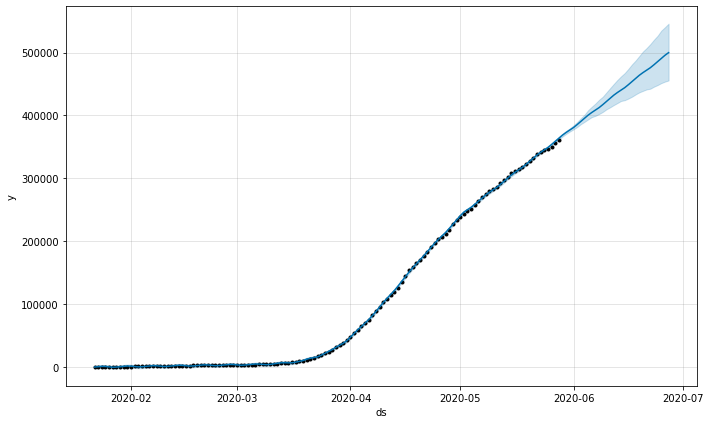

In [0]:
confirmed_forecast_plot = m.plot(previsao)

In [0]:
import pandas as pd
import numpy as np

from fbprophet import Prophet

In [0]:
dfcovid = pd.read_csv('https://brasil.io/dataset/covid19/caso/?place_type=state&format=csv')

In [0]:
dfcovid.tail(3)

,date,state,city,place_type,confirmed,deaths,is_last,estimated_population_2019,city_ibge_code,confirmed_per_100k_inhabitants,death_rate
2019,2020-02-27,SP,NaN,state,1,0,False,45919049,35,0.00218,0.0
2020,2020-02-26,SP,NaN,state,1,0,False,45919049,35,0.00218,0.0
2021,2020-02-25,SP,NaN,state,1,0,False,45919049,35,0.00218,0.0


In [0]:
deaths = dfcovid.groupby('date').sum()['deaths'].reset_index()

In [0]:
deaths.tail(3)

,date,deaths
92,2020-05-27,25180
93,2020-05-28,26408
94,2020-05-29,19970


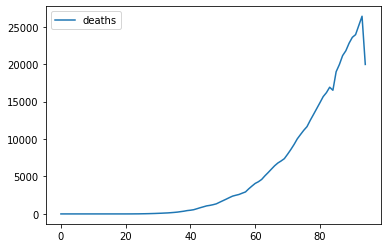

In [0]:
deaths.plot()

In [0]:
deaths.columns = ['ds','y']

In [0]:
m = Prophet(interval_width=0.95)
m.fit(deaths)
future = m.make_future_dataframe(periods=30)
future.tail(7)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds
118,2020-06-22
119,2020-06-23
120,2020-06-24
121,2020-06-25
122,2020-06-26
123,2020-06-27
124,2020-06-28


In [0]:
previsao = m.predict(future)
previsao.tail(30)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
95,2020-05-30,25838.332647,24582.567227,27167.588836,25797.186993,25861.866187,64.596506,64.596506,64.596506,64.596506,64.596506,64.596506,0.0,0.0,0.0,25902.929153
96,2020-05-31,26554.849251,25310.882157,27900.321673,26454.849581,26636.816457,30.115864,30.115864,30.115864,30.115864,30.115864,30.115864,0.0,0.0,0.0,26584.965115
97,2020-06-01,27271.365855,26028.478266,28577.571888,27090.765501,27425.072769,0.061162,0.061162,0.061162,0.061162,0.061162,0.061162,0.0,0.0,0.0,27271.427017
98,2020-06-02,27987.882459,26579.800606,29285.547613,27735.781842,28242.123358,-69.488402,-69.488402,-69.488402,-69.488402,-69.488402,-69.488402,0.0,0.0,0.0,27918.394057
99,2020-06-03,28704.399063,27497.427542,30130.752794,28347.770761,29068.146932,99.440804,99.440804,99.440804,99.440804,99.440804,99.440804,0.0,0.0,0.0,28803.839867
100,2020-06-04,29420.915667,28236.742905,30831.984384,28949.083293,29888.658891,170.069335,170.069335,170.069335,170.069335,170.069335,170.069335,0.0,0.0,0.0,29590.985002
101,2020-06-05,30137.432271,28414.487695,31177.371395,29563.324357,30701.725276,-294.795269,-294.795269,-294.795269,-294.795269,-294.795269,-294.795269,0.0,0.0,0.0,29842.637001
102,2020-06-06,30853.948874,29568.003004,32267.625875,30166.062619,31511.840254,64.596506,64.596506,64.596506,64.596506,64.596506,64.596506,0.0,0.0,0.0,30918.545380
103,2020-06-07,31570.465478,30171.008127,33115.828069,30724.021015,32370.831026,30.115864,30.115864,30.115864,30.115864,30.115864,30.115864,0.0,0.0,0.0,31600.581342
104,2020-06-08,32286.982082,30694.467538,33843.099373,31337.565079,33226.446467,0.061162,0.061162,0.061162,0.061162,0.061162,0.061162,0.0,0.0,0.0,32287.043244


In [0]:
previsao[['ds','yhat_lower','yhat','yhat_upper']].tail(7)

,ds,yhat_lower,yhat,yhat_upper
118,2020-06-22,38755.096028,42318.275698,45517.157120
119,2020-06-23,39611.405115,42965.242738,46261.902490
120,2020-06-24,40191.666339,43850.688548,47350.810563
121,2020-06-25,40702.312406,44637.833683,48228.253669
122,2020-06-26,41114.124545,44889.485682,48916.919962
123,2020-06-27,41585.968207,45965.394062,50134.890116
124,2020-06-28,42213.676644,46647.430024,50851.069262


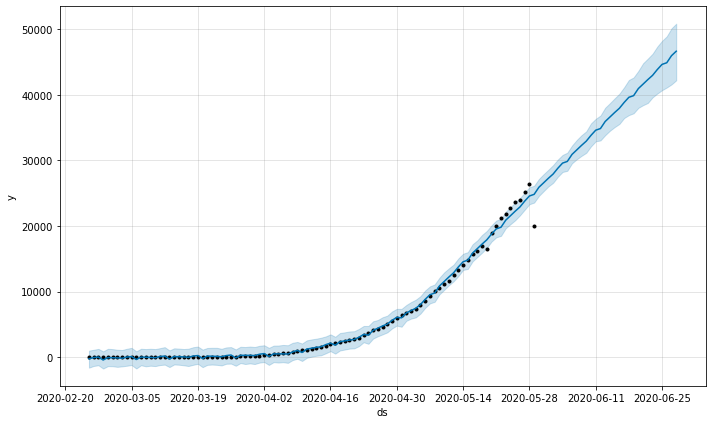

In [0]:
confirmed_forecast_plot = m.plot(previsao)

In [0]:
import altair as alt
import pandas as pd

In [0]:
dfcovid = pd.read_csv('https://brasil.io/dataset/covid19/caso/?place_type=state&format=csv')

In [0]:
cases = dfcovid.loc[dfcovid.place_type == "state", ['state', 'date', 'deaths']]

In [0]:
cases.tail(3)

,state,date,deaths
2019,SP,2020-02-27,0
2020,SP,2020-02-26,0
2021,SP,2020-02-25,0


In [0]:
alt.Chart(cases).mark_point().encode(
    x='date',
    y='deaths',
    color='state',
).interactive()

alt.Chart(...)

### Genoma Sars-cov-2 visualização Gráfica

In [0]:
entrada = open("sequence.fasta").read()
saida = open("Genoma_covid.html", "w")

cont = {}

In [0]:
for i in ['A', 'T', 'C', 'G']:
    for j in ['A', 'T', 'C', 'G']:
        cont[i + j] = 0

entrada = entrada.replace("\n", "")
for k in range(len(entrada)-1):
    cont[entrada[k] + entrada[k + 1]] += 1

In [0]:
cont

{'AA': 1742,
 'AC': 1397,
 'AG': 1296,
 'AT': 1598,
 'CA': 1564,
 'CC': 651,
 'CG': 374,
 'CT': 1539,
 'GA': 1227,
 'GC': 997,
 'GG': 860,
 'GT': 1437,
 'TA': 1500,
 'TC': 1083,
 'TG': 1991,
 'TT': 1964}

In [0]:
i = 1

for k in cont:
    transparencia = cont[k]/max(cont.values())
    saida.write("<div style='width:100px; border: 1px solid #111; color:#fff; height: 100px; float:left; background-color:rgba(0, 0, 0, " +
                str(transparencia) + "')>"+k+"</div>")

    if i % 4 == 0:
        saida.write("<div style='clear:both'></div>")
    i += 1

saida.close()


In [0]:
from IPython.display import HTML

In [0]:
HTML(filename="Genoma_covid.html")